In [2]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
events = pd.read_csv("athlete_events.csv")
regions = pd.read_csv("noc_regions.csv")

In [4]:
events.head(1)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN


In [5]:
regions.head(1)

,NOC,region,notes
0,AFG,Afghanistan,NaN


Lets first concentrate only on the Summer Olympics

In [6]:
events = events[events['Season'] == "Summer"]
events.head(2)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN


Adding the region names according to the regions dataframe



In [7]:
events = events.merge(regions,on='NOC',how='left')
events.head(2)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN


Finding all the countries that have participated in the Summer Olympics

In [8]:
events['region'].unique()

array(['China', 'Denmark', 'Netherlands', 'Finland', 'Norway', 'Romania',
       'Estonia', 'France', 'Morocco', 'Spain', 'Egypt', 'Iran',
       'Bulgaria', 'Italy', 'Chad', 'Azerbaijan', 'Sudan', 'Russia',
       'Argentina', 'Cuba', 'Belarus', 'Greece', 'Cameroon', 'Turkey',
       'Chile', 'Mexico', 'USA', 'Nicaragua', 'Hungary', 'Nigeria',
       'Algeria', 'Kuwait', 'Bahrain', 'Pakistan', 'Iraq', 'Syria',
       'Lebanon', 'Qatar', 'Malaysia', 'Germany', 'Canada', 'Ireland',
       'Australia', 'South Africa', 'Eritrea', 'Tanzania', 'Jordan',
       'Tunisia', 'Libya', 'Belgium', 'Djibouti', 'Palestine', 'Comoros',
       'Kazakhstan', 'Brunei', 'India', 'Saudi Arabia', 'Maldives',
       'Ethiopia', 'United Arab Emirates', 'Yemen', 'Indonesia',
       'Philippines', nan, 'Uzbekistan', 'Kyrgyzstan', 'Tajikistan',
       'Japan', 'Republic of Congo', 'Switzerland', 'Brazil', 'Monaco',
       'Israel', 'Uruguay', 'Sweden', 'Sri Lanka', 'Armenia',
       'Ivory Coast', 'Kenya', 'Ben

checking for missing values

In [9]:
events.isnull().sum()

ID             0
Name           0
Sex            0
Age         9189
Height     51857
Weight     53854
Team           0
NOC            0
Games          0
Year           0
Season         0
City           0
Sport          0
Event          0
Medal     188464
region       370
notes     218151
dtype: int64

In [10]:
events.shape

(222552, 17)

In [11]:
events[events['Age'].isnull()]['Year'].mode()

0    1948
Name: Year, dtype: int64

In [12]:
events[events['Height'].isnull()]['Year'].mode()

0    1952
Name: Year, dtype: int64

In [13]:
events[events['Weight'].isnull()]['Year'].mode()

0    1952
Name: Year, dtype: int64

In [14]:
events[events['region'].isnull()].head()

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes
509,332,Zarinah Abdullah,F,21.0,NaN,NaN,Singapore,SGP,1992 Summer,1992,Summer,Barcelona,Badminton,Badminton Women's Singles,NaN,NaN,NaN
510,332,Zarinah Abdullah,F,25.0,NaN,NaN,Singapore,SGP,1996 Summer,1996,Summer,Atlanta,Badminton,Badminton Women's Singles,NaN,NaN,NaN
2362,1515,Saiyidah Aisyah Mohamed Rafa'ee,F,28.0,173.0,68.0,Singapore,SGP,2016 Summer,2016,Summer,Rio de Janeiro,Rowing,Rowing Women's Single Sculls,NaN,NaN,NaN
5523,3515,Paulo Amotun Lokoro,M,24.0,170.0,61.0,Refugee Olympic Athletes,ROT,2016 Summer,2016,Summer,Rio de Janeiro,Athletics,"Athletics Men's 1,500 metres",NaN,NaN,Refugee Olympic Team
6652,4264,Ang Peng Siong,M,21.0,180.0,75.0,Singapore,SGP,1984 Summer,1984,Summer,Los Angeles,Swimming,Swimming Men's 100 metres Freestyle,NaN,NaN,NaN


Here, many values of Age, Height and weight of the athelete are missing from the year of 1948 and 1952.

As we may find, there are many missing values of region where as this may not be the case for NOC. This is because many a times a collection of countries or a part of a country take part. Thus, they don't have their regions listed.

Lets check for duplicated rows in the data.

In [15]:
events.duplicated().sum()

1385

As we have duplicated data in our dataset, we need to delete it from our dataset to avoid repetations.

In [16]:
events.drop_duplicates(inplace=True)

In [17]:
events.duplicated().sum()

0

Lets first find out how many number of medals are won on the basis of NOC.

In [18]:
events['Medal'].value_counts()

Gold      11456
Bronze    11409
Silver    11212
Name: Medal, dtype: int64

This data is in the text format like Gold, Silver, Bronze, Nan. so lets rather convert the data into columns. 

Gold, Silver and Bronze columns which will contain which medal is won by the particular NOC.

In [19]:
pd.get_dummies(events['Medal'])

,Bronze,Gold,Silver
0,0,0,0
1,0,0,0
2,0,0,0
3,0,1,0
4,0,0,0
...,...,...,...
222547,0,0,0
222548,0,0,0
222549,0,0,0
222550,0,0,0


In [20]:
events = pd.concat([events,pd.get_dummies(events['Medal'])], axis='columns')

In [21]:
events

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,Bronze,Gold,Silver
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN,0,0,0
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN,0,0,0
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN,0,0,0
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN,0,1,0
4,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NaN,Netherlands,NaN,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222547,135565,Fernando scar Zylberberg,M,27.0,168.0,76.0,Argentina,ARG,2004 Summer,2004,Summer,Athina,Hockey,Hockey Men's Hockey,NaN,Argentina,NaN,0,0,0
222548,135566,"James Francis ""Jim"" Zylker",M,21.0,175.0,75.0,United States,USA,1972 Summer,1972,Summer,Munich,Football,Football Men's Football,NaN,USA,NaN,0,0,0
222549,135567,Aleksandr Viktorovich Zyuzin,M,24.0,183.0,72.0,Russia,RUS,2000 Summer,2000,Summer,Sydney,Rowing,Rowing Men's Lightweight Coxless Fours,NaN,Russia,NaN,0,0,0
222550,135567,Aleksandr Viktorovich Zyuzin,M,28.0,183.0,72.0,Russia,RUS,2004 Summer,2004,Summer,Athina,Rowing,Rowing Men's Lightweight Coxless Fours,NaN,Russia,NaN,0,0,0


In [22]:
events.groupby('NOC').sum()[['Gold','Silver','Bronze']].sort_values('Gold',ascending = False).reset_index()

,NOC,Gold,Silver,Bronze
0,USA,2472.0,1333.0,1197.0
1,URS,832.0,635.0,596.0
2,GBR,635.0,729.0,620.0
3,GER,592.0,538.0,649.0
4,ITA,518.0,474.0,454.0
...,...,...,...,...
225,AHO,0.0,1.0,0.0
226,LBR,0.0,0.0,0.0
227,LCA,0.0,0.0,0.0
228,LES,0.0,0.0,0.0


This is data obtained here is found to be wrong when matched with a wikipedia article.

Let check for the reasons behind this problems .

In [23]:
events[(events['NOC'] == 'IND') & (events['Gold'] == 1)]

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,Bronze,Gold,Silver
4186,2699,Shaukat Ali,M,30.0,NaN,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
4190,2703,Syed Mushtaq Ali,M,22.0,165.0,61.0,India,IND,1964 Summer,1964,Summer,Tokyo,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
4460,2864,Richard James Allen,M,25.0,172.0,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
4461,2864,Richard James Allen,M,30.0,172.0,NaN,India,IND,1932 Summer,1932,Summer,Los Angeles,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
4462,2864,Richard James Allen,M,34.0,172.0,NaN,India,IND,1936 Summer,1936,Summer,Berlin,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191759,117232,Dung Dung Sylvanus,M,31.0,160.0,62.0,India,IND,1980 Summer,1980,Summer,Moskva,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
193964,118553,Carlyle Carrol Tapsell,M,23.0,182.0,NaN,India,IND,1932 Summer,1932,Summer,Los Angeles,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
193965,118553,Carlyle Carrol Tapsell,M,27.0,182.0,NaN,India,IND,1936 Summer,1936,Summer,Berlin,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
205949,125560,"Max ""Maxie"" Vaz",M,NaN,NaN,NaN,India,IND,1948 Summer,1948,Summer,London,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0


In [24]:
events[(events['NOC'] == 'IND') & (events['Gold'] == 1) & (events['Year'] == 1928)]

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,Bronze,Gold,Silver
4186,2699,Shaukat Ali,M,30.0,NaN,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
4460,2864,Richard James Allen,M,25.0,172.0,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
32103,19716,Dhyan Chand Bais,M,22.0,169.0,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
64140,39020,Michael Anthony Gateley,M,23.0,NaN,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
68522,41710,"William James ""Willie"" Goodsir-Cullen",M,21.0,NaN,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
74395,45360,Leslie Charles Hammond,M,23.0,184.0,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
96371,59150,"Feroz-ud-Din ""Feroze"" Khan",M,23.0,NaN,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
123521,75490,George Eric McCarthy Marthins,M,22.0,NaN,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
142578,86987,"Richard Alexander ""Rex"" Norris",M,28.0,NaN,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0
155720,95008,Broome Eric Pinniger,M,25.0,180.0,NaN,India,IND,1928 Summer,1928,Summer,Amsterdam,Hockey,Hockey Men's Hockey,Gold,India,NaN,0,1,0


In [25]:
events[(events['NOC'] == 'IND') & (events['Silver'] == 1) & (events['Year'] == 1960)]

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,Bronze,Gold,Silver
7056,4518,"Joseph Anthony ""Joe"" Antic",M,29.0,168.0,59.0,India,IND,1960 Summer,1960,Summer,Roma,Hockey,Hockey Men's Hockey,Silver,India,NaN,0,0,1
35548,21912,Leslie Walter Claudius,M,33.0,162.0,53.0,India,IND,1960 Summer,1960,Summer,Roma,Hockey,Hockey Men's Hockey,Silver,India,NaN,0,0,1
107624,66061,Mohinder Lal,M,24.0,165.0,58.0,India,IND,1960 Summer,1960,Summer,Roma,Hockey,Hockey Men's Hockey,Silver,India,NaN,0,0,1
109671,67372,Shankar Pillay Laxman,M,27.0,167.0,64.0,India,IND,1960 Summer,1960,Summer,Roma,Hockey,Hockey Men's Hockey,Silver,India,NaN,0,0,1
153606,93798,"Victor John ""V. J."" Peter",M,23.0,165.0,59.0,India,IND,1960 Summer,1960,Summer,Roma,Hockey,Hockey Men's Hockey,Silver,India,NaN,0,0,1
174232,106335,Govind Rao Sawant,M,24.0,171.0,60.0,India,IND,1960 Summer,1960,Summer,Roma,Hockey,Hockey Men's Hockey,Silver,India,NaN,0,0,1
178818,109296,Jaman Lal Sharma,M,24.0,169.0,59.0,India,IND,1960 Summer,1960,Summer,Roma,Hockey,Hockey Men's Hockey,Silver,India,NaN,0,0,1
181553,111028,Charanjit Singh,M,29.0,175.0,58.0,India,IND,1960 Summer,1960,Summer,Roma,Hockey,Hockey Men's Hockey,Silver,India,NaN,0,0,1
181578,111047,"Joginder ""Gindi"" Singh",M,20.0,171.0,65.0,India,IND,1960 Summer,1960,Summer,Roma,Hockey,Hockey Men's Hockey,Silver,India,NaN,0,0,1
181627,111083,Jaswant Singh,M,29.0,185.0,77.0,India,IND,1960 Summer,1960,Summer,Roma,Hockey,Hockey Men's Hockey,Silver,India,NaN,0,0,1


It seems the data is arranged according to the players, and therefore even if a team wins a medal then in this dataset it regarded that all the players of the team have won that same medal this created duplicacy.

To remove this duplicacy we need to remove the ententries with same 'Team', 'NOC', 'Games', 'City', 'Sport', 'Event'and 'Medal'.

In [26]:
nos_medal = events.drop_duplicates(subset = ['Team', 'NOC', 'Games', 'City', 'Sport', 'Event', 'Medal'])

In [27]:
nos_medal.groupby('region').sum()[['Gold','Silver','Bronze']].sort_values('Gold',ascending = False).reset_index()

,region,Gold,Silver,Bronze
0,USA,1035.0,802.0,708.0
1,Russia,592.0,498.0,487.0
2,Germany,444.0,457.0,491.0
3,UK,278.0,317.0,300.0
4,France,234.0,256.0,287.0
...,...,...,...,...
200,Lesotho,0.0,0.0,0.0
201,Albania,0.0,0.0,0.0
202,Libya,0.0,0.0,0.0
203,Liechtenstein,0.0,0.0,0.0


Now, this data can be used for our use.

In [28]:
nos_medal['Total'] = nos_medal['Gold'] + nos_medal['Silver'] + nos_medal['Bronze']
nos_medal.groupby('region').sum()[['Gold','Silver','Bronze','Total']].sort_values('Gold',ascending = False).reset_index()

/var/folders/bd/0d2v_7mn4wl3rxllb0m23s2r0000gn/T/ipykernel_18835/14078856.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nos_medal['Total'] = nos_medal['Gold'] + nos_medal['Silver'] + nos_medal['Bronze']


,region,Gold,Silver,Bronze,Total
0,USA,1035.0,802.0,708.0,2545.0
1,Russia,592.0,498.0,487.0,1577.0
2,Germany,444.0,457.0,491.0,1392.0
3,UK,278.0,317.0,300.0,895.0
4,France,234.0,256.0,287.0,777.0
...,...,...,...,...,...
200,Lesotho,0.0,0.0,0.0,0.0
201,Albania,0.0,0.0,0.0,0.0
202,Libya,0.0,0.0,0.0,0.0
203,Liechtenstein,0.0,0.0,0.0,0.0


we will try to find the tally on the basis of 2 different factors.

The 2 factors are year and region

In [29]:
['Overall'] + sorted(events.Year.unique().tolist())

['Overall',
 1896,
 1900,
 1904,
 1906,
 1908,
 1912,
 1920,
 1924,
 1928,
 1932,
 1936,
 1948,
 1952,
 1956,
 1960,
 1964,
 1968,
 1972,
 1976,
 1980,
 1984,
 1988,
 1992,
 1996,
 2000,
 2004,
 2008,
 2012,
 2016]

In [30]:
pickle.dump(['Overall'] + sorted(events.Year.unique().tolist()),open("year.txt",'wb'))

In [31]:
sorted(events.region.dropna().unique().tolist())

['Afghanistan',
 'Albania',
 'Algeria',
 'American Samoa',
 'Andorra',
 'Angola',
 'Antigua',
 'Argentina',
 'Armenia',
 'Aruba',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bermuda',
 'Bhutan',
 'Boliva',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'Brunei',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Cape Verde',
 'Cayman Islands',
 'Central African Republic',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Comoros',
 'Cook Islands',
 'Costa Rica',
 'Croatia',
 'Cuba',
 'Curacao',
 'Cyprus',
 'Czech Republic',
 'Democratic Republic of the Congo',
 'Denmark',
 'Djibouti',
 'Dominica',
 'Dominican Republic',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Equatorial Guinea',
 'Eritrea',
 'Estonia',
 'Ethiopia',
 'Fiji',
 'Finland',
 'France',
 'Gabon',
 'Gambia',
 'Georgia',
 'Germany',
 'Ghana',
 'Greece',
 'Grenada',
 'Guam',
 'Guatemala',
 'Guinea',
 'Guin

In [32]:
pickle.dump(['Overall'] + sorted(events.region.dropna().unique().tolist()),open("regions.txt",'wb'))

In [33]:
sorted(events.Sport.unique().tolist())

['Aeronautics',
 'Alpinism',
 'Archery',
 'Art Competitions',
 'Athletics',
 'Badminton',
 'Baseball',
 'Basketball',
 'Basque Pelota',
 'Beach Volleyball',
 'Boxing',
 'Canoeing',
 'Cricket',
 'Croquet',
 'Cycling',
 'Diving',
 'Equestrianism',
 'Fencing',
 'Figure Skating',
 'Football',
 'Golf',
 'Gymnastics',
 'Handball',
 'Hockey',
 'Ice Hockey',
 'Jeu De Paume',
 'Judo',
 'Lacrosse',
 'Modern Pentathlon',
 'Motorboating',
 'Polo',
 'Racquets',
 'Rhythmic Gymnastics',
 'Roque',
 'Rowing',
 'Rugby',
 'Rugby Sevens',
 'Sailing',
 'Shooting',
 'Softball',
 'Swimming',
 'Synchronized Swimming',
 'Table Tennis',
 'Taekwondo',
 'Tennis',
 'Trampolining',
 'Triathlon',
 'Tug-Of-War',
 'Volleyball',
 'Water Polo',
 'Weightlifting',
 'Wrestling']

In [34]:
pickle.dump(['Overall'] + sorted(events.Sport.unique().tolist()),open("sports.txt",'wb'))

Lets go over making the overall analysis

In [35]:
events['Year'].unique().shape[0]

29

In [36]:
events['Name'].unique().shape[0]

116122

In [37]:
events['Sport'].unique().shape[0]

52

In [38]:
events['Event'].unique().shape[0]

651

In [39]:
events['region'].unique().shape[0]

206

In [40]:
events['City'].unique().shape[0]

23

Graph of participating countries (Year wise)

In [41]:
events.drop_duplicates(['Year','region'])

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,Bronze,Gold,Silver
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN,0,0,0
1,2,A Lamusi,M,23.0,170.0,60.0,China,CHN,2012 Summer,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,NaN,China,NaN,0,0,0
2,3,Gunnar Nielsen Aaby,M,24.0,NaN,NaN,Denmark,DEN,1920 Summer,1920,Summer,Antwerpen,Football,Football Men's Football,NaN,Denmark,NaN,0,0,0
3,4,Edgar Lindenau Aabye,M,34.0,NaN,NaN,Denmark/Sweden,DEN,1900 Summer,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold,Denmark,NaN,0,1,0
4,8,"Cornelia ""Cor"" Aalten (-Strannood)",F,18.0,168.0,NaN,Netherlands,NED,1932 Summer,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,NaN,Netherlands,NaN,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198805,121320,Horatio Tertuliano Torrom,M,NaN,NaN,NaN,Argentina,ARG,1908 Summer,1908,Summer,London,Figure Skating,Figure Skating Men's Singles,NaN,Argentina,NaN,0,0,0
203075,123858,Lloyd Oscar Valberg,M,26.0,NaN,NaN,Singapore,SGP,1948 Summer,1948,Summer,London,Athletics,Athletics Men's High Jump,NaN,NaN,NaN,0,0,0
209763,127894,Bruno Julius Wagner,M,25.0,185.0,82.0,Switzerland,SUI,1908 Summer,1908,Summer,London,Athletics,Athletics Men's Hammer Throw,NaN,Switzerland,NaN,0,0,0
215352,131186,Antoni Wiwulski,M,35.0,NaN,NaN,Poland,POL,1912 Summer,1912,Summer,Stockholm,Art Competitions,Art Competitions Mixed Sculpturing,NaN,Poland,NaN,0,0,0


In [42]:
events.drop_duplicates(['Year','region'])['Year'].value_counts().reset_index().sort_values('index')

,index,Year
28,1896,12
22,1900,31
27,1904,14
26,1906,20
25,1908,22
24,1912,29
23,1920,29
21,1924,45
20,1928,46
19,1932,47


Plotting a heat map of number of events overtime 

In [43]:
x = events.drop_duplicates (['Year', 'Sport', 'Event'])

<AxesSubplot:xlabel='Year', ylabel='Sport'>

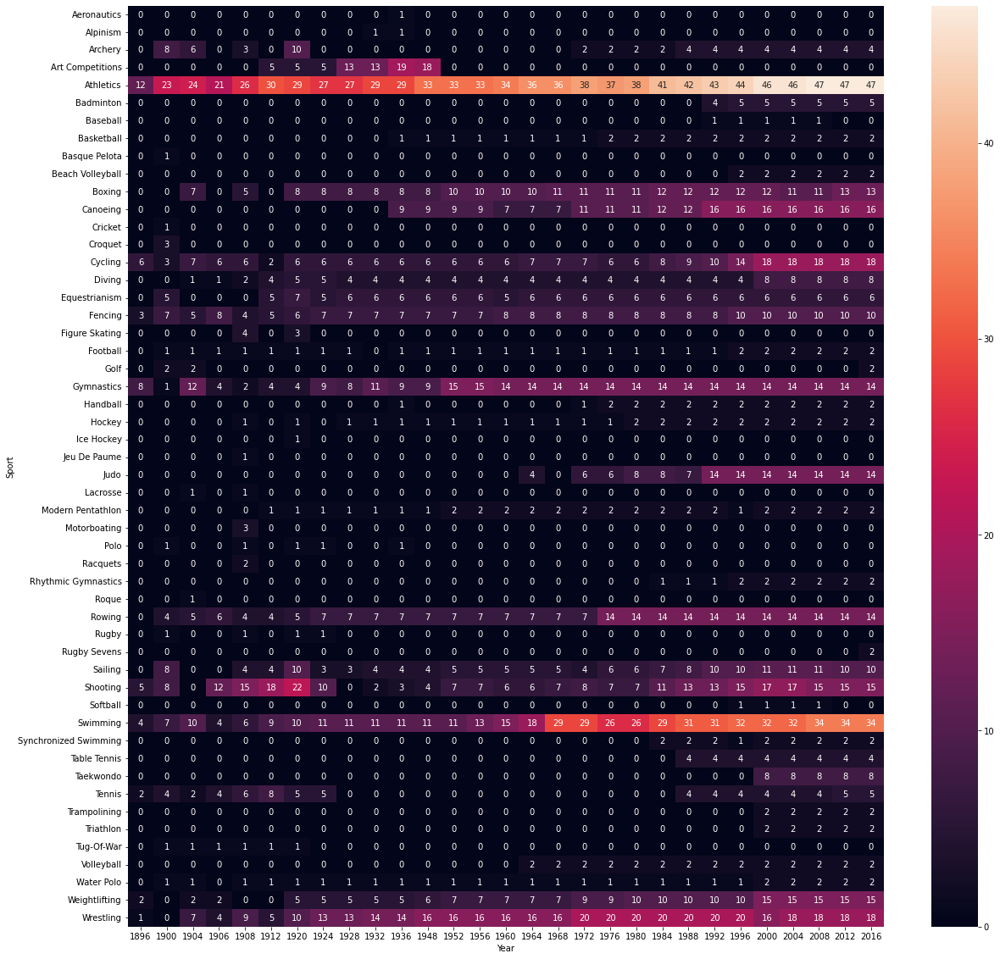

In [44]:
plt.figure(figsize=(20,20))
sns.heatmap(x.pivot_table(index='Sport', columns= 'Year', values='Event', aggfunc='count').fillna(0).astype('int'), annot=True)

Finding most decorated athletes on the basis of sports

In [45]:
events.head(1)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,Bronze,Gold,Silver
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN,0,0,0


In [46]:
df = events.dropna(subset=['Medal'])
df = df[df['Sport'] == "Sailing"]
df = df['Name'].value_counts().reset_index().head(10)
df.rename(columns={'index' : 'Name','Name' : 'Total Medals'},inplace=True)
df = df.merge(events,on = 'Name')
df.drop_duplicates(['Name'],inplace = True)
df = df[['Name',"Event", "region","Total Medals"]]
df

,Name,Event,region,Total Medals
0,Torben Schmidt Grael,Sailing Mixed Three Person Keelboat,Brazil,5
6,"Charles Benedict ""Ben"" Ainslie",Sailing Mixed One Person Dinghy,UK,5
11,Robert Scheidt,Sailing Mixed One Person Dinghy,Brazil,5
17,Tore Anton Holm,Sailing Mixed 40 metres,Sweden,4
22,Jochen Schmann,Sailing Mixed One Person Dinghy,Germany,4
28,Carlos Mauricio Espnola Lorenzo,Sailing Men's Windsurfer,Argentina,4
33,Paul Bert Elvstrm,Sailing Mixed One Person Dinghy,Denmark,4
41,Valentyn Hryhorovych Mankin,Sailing Mixed One Person Dinghy,Russia,4
45,Alessandra Sensini,Sailing Women's Windsurfer,Italy,4
51,Santiago Ral Lange Roberti,Sailing Mixed Three Person Keelboat,Argentina,3


Lets now work in Country wise Analysis

In [49]:
temp_df = events.dropna(subset=['Medal'])
temp_df.drop_duplicates(subset=['Team','NOC','Games','Year','City','Sport','Event','Medal'],inplace = True)
temp_df = temp_df[temp_df['region'] == 'India']
temp_df.groupby('Year').count()['Medal'].reset_index()

/var/folders/bd/0d2v_7mn4wl3rxllb0m23s2r0000gn/T/ipykernel_18835/1828829991.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df.drop_duplicates(subset=['Team','NOC','Games','Year','City','Sport','Event','Medal'],inplace = True)


,Year,Medal
0,1900,2
1,1928,1
2,1932,1
3,1936,1
4,1948,1
5,1952,2
6,1956,1
7,1960,1
8,1964,1
9,1968,1


country wise heatmap

In [50]:
temp_df = events.dropna(subset=['Medal'])
temp_df.drop_duplicates(subset=['Team','NOC','Games','Year','City','Sport','Event','Medal'],inplace = True)
temp_df = temp_df[temp_df['region'] == 'India']

/var/folders/bd/0d2v_7mn4wl3rxllb0m23s2r0000gn/T/ipykernel_18835/3929511667.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df.drop_duplicates(subset=['Team','NOC','Games','Year','City','Sport','Event','Medal'],inplace = True)


<AxesSubplot:xlabel='Year', ylabel='Sport'>

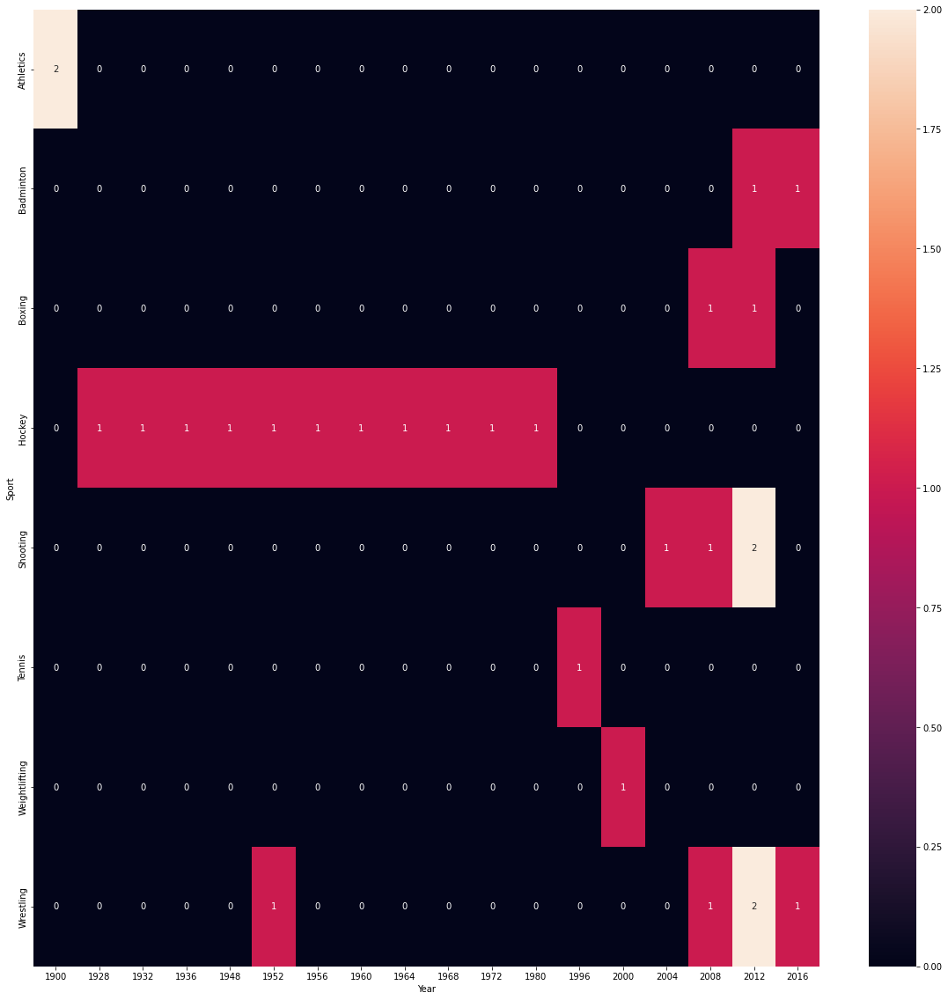

In [52]:
plt.figure(figsize=(20,20))
sns.heatmap(temp_df.pivot_table(index='Sport', columns= 'Year', values='Medal', aggfunc='count').fillna(0).astype('int'), annot=True)

In [54]:
pickle.load(open("regions.txt","rb"))[1:].index("USA")

191

most successfull players from a country in a sport

In [61]:
temp_df = events.dropna(subset=['Medal'])

temp_df = temp_df[temp_df['region'] == "India"]

temp_df = temp_df['Name'].value_counts().reset_index().head(10)
temp_df.rename(columns={'index' : 'Name','Name' : 'Total Medals'},inplace=True)
temp_df = temp_df.merge(events,on = 'Name')
temp_df.drop_duplicates(['Name'],inplace = True)
temp_df = temp_df[['Name',"Event","Total Medals"]].reset_index()
temp_df.drop('index',axis = 'columns')

,Name,Event,Total Medals
0,Udham Singh Kular,Hockey Men's Hockey,4
1,Leslie Walter Claudius,Hockey Men's Hockey,4
2,Shankar Pillay Laxman,Hockey Men's Hockey,3
3,Ranganathan Francis,Hockey Men's Hockey,3
4,Richard James Allen,Hockey Men's Hockey,3
5,Balbir Singh,Hockey Men's Hockey,3
6,Harbinder Singh Chimni,Hockey Men's Hockey,3
7,"Balbir Singh Dosanjh, Sr.",Hockey Men's Hockey,3
8,"Victor John ""V. J."" Peter",Hockey Men's Hockey,3
9,Dhyan Chand Bais,Hockey Men's Hockey,3


Athlete wise analysis

In [62]:
athlete_df = events.drop_duplicates(subset=['Name', 'region'])
x1 = athlete_df['Age'].dropna()
x2 = athlete_df[athlete_df['Medal'] == 'Gold']['Age'].dropna()
x3 = athlete_df[athlete_df['Medal'] == 'Silver']['Age'].dropna()
x4 = athlete_df[athlete_df['Medal'] == 'Bronze']['Age'].dropna()

In [64]:
import plotly.figure_factory as ff
fig = ff.create_distplot([x1,x2,x3,x4],['Medalist Age','Gold Medalist','Silver Medalist','Bronze Medalist'],show_hist=False)
fig.show()

In [119]:
def age_sports(df,medal):
    athlete_df = df.drop_duplicates(subset=['Name', 'region'])
    x = []
    name = []
    sports = ['Basketball', 'Judo', 'Football', 'Tug-Of-War', 'Athletics',
    'Swimming', 'Badminton', 'Sailing', 'Gymnastics',
    'Art Competitions', 'Handball', 'Weightlifting', 'Wrestling',
    'Water Polo', 'Hockey', 'Rowing', 'Fencing',
    'Shooting', 'Boxing', 'Taekwondo', 'Cycling', 'Diving', 'Canoeing',
    'Tennis', 'Golf', 'Softball', 'Archery',
    'Volleyball', 'Synchronized Swimming', 'Table Tennis', 'Baseball',
    'Rhythmic Gymnastics', 'Rugby Sevens',
    'Beach Volleyball', 'Triathlon', 'Polo', 'Ice Hockey']

    for sport in sports:
        temp_df = athlete_df[athlete_df['Sport'] == sport]
        x.append(temp_df[temp_df['Medal'] == medal]['Age'].dropna())
        name.append(sport)


    return x,name

In [122]:
x,name = age_sports(events,'Gold')
fig = ff.create_distplot(x,name)
fig.show()

Lets now plot the height and weight data of every athlete

In [123]:
athlete_df.head(1)

,ID,Name,Sex,Age,Height,Weight,Team,NOC,Games,Year,Season,City,Sport,Event,Medal,region,notes,Bronze,Gold,Silver
0,1,A Dijiang,M,24.0,180.0,80.0,China,CHN,1992 Summer,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,NaN,China,NaN,0,0,0


In [133]:
import plotly.express as px
athlete_df = events.drop_duplicates(subset=['Name', 'region'])
athlete_df['Medal'].fillna("No Medal",inplace = True)
fig = px.scatter(athlete_df,x = "Weight",y='Height',color = 'Medal',symbol = 'Sex')
fig.show()